some codes of autoencoder and drawing graph reference to this book: Beginning Anomaly Detection Using Python-Based Deep Learning written by Sridhar Alla and Suman Kalyan Adari.

In [1]:
import keras
from keras import optimizers
from keras import losses
from keras.models import Sequential, Model
from keras.layers import Dense, Input, Dropout, Embedding, LSTM
from keras.optimizers import RMSprop,Adam, Nadam
from keras.preprocessing import sequence
from keras.callbacks import TensorBoard

import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_auc_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline


import tensorflow as tf
from sklearn.metrics import classification_report
import sys

print("Python: ", sys.version)

print("pandas: ", pd.__version__)
print("numpy: ", np.__version__)
print("seaborn: ", sns.__version__)
print("matplotlib: ", matplotlib.__version__)
print("sklearn: ", sklearn.__version__)
print("keras: ", keras.__version__)
print("Tensorflow: ", tf.__version__)

2023-06-30 14:37:17.436815: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Python:  3.10.9 (main, Mar  1 2023, 12:33:47) [Clang 14.0.6 ]
pandas:  1.5.3
numpy:  1.23.5
seaborn:  0.12.2
matplotlib:  3.7.0
sklearn:  1.2.1
keras:  2.10.0
Tensorflow:  2.10.0


In [2]:
# from tensorflow.python.ops.gen_nn_ops import data_format_vec_permute_eager_fallback
feature = pd.read_csv("NUSW-NB15_features.csv",  encoding='latin')
df = pd.read_csv("UNSW-NB15_1.csv", names = feature['Name'])

/var/folders/f2/k_crtpy13v92_l6zt1d22jzr0000gn/T/ipykernel_45452/3494847583.py:3: DtypeWarning: Columns (1,3,47) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("UNSW-NB15_1.csv", names = feature['Name'])


In [3]:
# attack data. it is imbalance data
len(df[df["Label"] == 1])/len(df)

0.03173566894904436

# EDA

In [4]:
# remove na
n = len(df)
for (attr,clumn) in df.items():
    amount = df[attr].isna().sum() 
    if amount > 0:
        print("Null value of {attr} : {amount} ({percent:.3f})".format(attr=attr, amount=amount, percent = amount/n))

Null value of attack_cat : 677786 (0.968)


In [5]:
df = df.drop('attack_cat', axis = 1)
df = df.dropna()

## Preprocessing the categorical variables

In [6]:
df_clean = df.copy()

In [7]:
# drop srcip, sport, dstip, dsport
df_clean = df_clean.drop(['srcip', 'sport', 'dstip', 'dsport'], axis = 1)

In [8]:
# labelencoder
le = LabelEncoder()
df_clean['proto'] = le.fit_transform(df_clean['proto'])
df_clean['service'] = le.fit_transform(df_clean['service'])
df_clean['state'] = le.fit_transform(df_clean['state'])

## Preprocessing the numerical variables

In [9]:
df_clean = df_clean.drop(['Stime', 'Ltime'], axis = 1)

# remove outliers

In [10]:
dtry = df_clean.copy()
dtry = dtry[dtry["Label"] == 0]

In [11]:
s = dtry.copy()
s = s[s["dur"] <= 1000]
s = s[s["Spkts"] <= 800]
wd = s[s["res_bdy_len"] <= 5000]
wd = wd[wd["Sjit"] <= 15000]
wd = wd[wd["Djit"] <= 12000]
wd = wd[wd["Sintpkt"] <= 50000]

data_clean = wd.copy()
anomal = df_clean[df_clean["Label"] == 1]
data = pd.concat([data_clean, anomal],axis=0)
data = data.sort_index(ascending=True)
len(wd)/len(df_clean)

0.9503486423590823

# sampling

In [12]:
df_sample, _ = train_test_split(data, test_size=0.8, 
                                stratify= data["Label"], random_state = 6, shuffle = True)

In [ ]:
len(df_sample[df_sample["Label"] == 0]) / len(df_sample)

0.9676853926046607

# Normalization

In [ ]:
num_col = list(df_sample.columns)
# num_col.remove('id')
num_col.remove('Label')

minmax_scale = MinMaxScaler(feature_range=(0, 1))
def normalization(df,col):
    for i in col:
        arr = df[i]
        arr = np.array(arr)
        df[i] = minmax_scale.fit_transform(arr.reshape(len(arr),1))
    return df

# Best Model 
### (due to randomness, the result may not exactly be the same as the report but the total trend is same. )

In [ ]:
data = df_sample

y = data['Label']
encoding_dim = 12
batch_size = 200
epochs = 20
f = 0

skf = StratifiedKFold(n_splits=4, random_state = 50, shuffle = True)

for train_index, test_index in skf.split(data, y): 
    X_cross, X_test = data.iloc[train_index,:], data.iloc[test_index,:]
    y_cross, y_test = y.iloc[train_index] , y.iloc[test_index]

    # split cross into train and valid dataset
    X_train, X_valid, y_train, y_valid = train_test_split(X_cross, y_cross, test_size=0.2,                                                        
                                                          stratify = y_cross, random_state= 42, shuffle = True)
    # delete 'Label' from X
    X_train = X_train[X_train['Label'] == 0]
    X_train = X_train.drop(['Label'], axis = 1)
    X_valid = X_valid.drop(['Label'], axis = 1)
    X_test = X_test.drop(['Label'], axis = 1)
    
    # scaled
    num_cols = X_train.columns[X_train.dtypes.apply(lambda c: np.issubdtype(c, np.number))]

        
    # normalizer
    X_train_scaled = normalization(X_train.copy(),num_col)
    X_valid_scaled = normalization(X_valid.copy(),num_col)
    X_test_scaled = normalization(X_test.copy(),num_col)
    
    #deep autoencoder
    logfilename = "simpleautoencoder"

    input_dim = X_train_scaled.shape[1]

    inputArray = Input(shape=(input_dim,))
    encoded = Dense(encoding_dim, activation='relu')(inputArray)

    decoded = Dense(input_dim, activation='sigmoid')(encoded)

    autoencoder = Model(inputArray, decoded)
    autoencoder.summary()
    
    cp = tf.keras.callbacks.ModelCheckpoint(filepath="autoencoder_fraud.h5",
                                   mode='min', monitor='val_loss', verbose=2, save_best_only=True)
    # define our early stopping
    early_stop = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        min_delta=0.0001,
        patience=10,
        verbose=1, 
        mode='min',
        restore_best_weights=True)

    # COMPILE NEW MODEL
    autoencoder.compile(optimizer= RMSprop(),
                    loss= 'mse',
                    metrics=['mae', 'accuracy'])
    # CREATE CALLBACKS

    history = autoencoder.fit(X_train_scaled, X_train_scaled,
                        batch_size=batch_size,
                        epochs=epochs,
                        verbose=1,
                        shuffle=True,
                        validation_data=(X_valid_scaled, X_valid_scaled),
    #                     callbacks=[TensorBoard(log_dir='../logs/{0}'.format(logfilename))]
                        callbacks=[cp, early_stop]
                        )
    
    # threshold in valid set
    valid_reconstructions = autoencoder.predict(X_valid_scaled)
    valid_error = tf.keras.losses.mse(valid_reconstructions, X_valid_scaled)
    
#     value = np.mean(np.array(valid_error)[(y_valid == 0).values]) + np.std(np.array(valid_error)[(y_valid == 0).values])
    value = np.percentile(np.array(valid_error)[(y_valid == 0).values], 95)
    if f > 0:
        threshold = (threshold + value)/2
    else:
        threshold = value
                                 
                                 
    reconstructions = autoencoder.predict(X_test_scaled)
    test_error = tf.keras.losses.mse(reconstructions, X_test_scaled)
    z_test = zip(test_error >= threshold, test_error)
    y_label_test =[]
    for idx, (is_anomaly, test_error) in enumerate(z_test):
        if is_anomaly:
            y_label_test.append(1)
        else:
            y_label_test.append(0)

    print(classification_report(y_test, y_label_test))
    f += 1

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 41)]              0         
                                                                 
 dense (Dense)               (None, 12)                504       
                                                                 
 dense_1 (Dense)             (None, 41)                533       
                                                                 
Total params: 1,037
Trainable params: 1,037
Non-trainable params: 0
_________________________________________________________________


2023-06-30 14:06:50.971254: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/20
356/400 [=========================>....] - ETA: 0s - loss: 0.0615 - mae: 0.1809 - accuracy: 0.3669
Epoch 1: val_loss improved from inf to 0.01180, saving model to autoencoder_fraud.h5
400/400 [==============================] - 1s 2ms/step - loss: 0.0564 - mae: 0.1679 - accuracy: 0.3603 - val_loss: 0.0118 - val_mae: 0.0580 - val_accuracy: 0.3036
Epoch 2/20
391/400 [============================>.] - ETA: 0s - loss: 0.0080 - mae: 0.0423 - accuracy: 0.7443
Epoch 2: val_loss improved from 0.01180 to 0.00555, saving model to autoencoder_fraud.h5
400/400 [==============================] - 1s 1ms/step - loss: 0.0079 - mae: 0.0421 - accuracy: 0.7476 - val_loss: 0.0055 - val_mae: 0.0345 - val_accuracy: 0.8815
Epoch 3/20
363/400 [==========================>...] - ETA: 0s - loss: 0.0033 - mae: 0.0258 - accuracy: 0.9305
Epoch 3: val_loss improved from 0.00555 to 0.00321, saving model to autoencoder_fraud.h5
400/400 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.02

                                                                 
Total params: 1,037
Trainable params: 1,037
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
393/400 [============================>.] - ETA: 0s - loss: 0.0594 - mae: 0.1732 - accuracy: 0.2257
Epoch 1: val_loss improved from inf to 0.01280, saving model to autoencoder_fraud.h5
400/400 [==============================] - 1s 2ms/step - loss: 0.0588 - mae: 0.1714 - accuracy: 0.2266 - val_loss: 0.0128 - val_mae: 0.0584 - val_accuracy: 0.2743
Epoch 2/20
352/400 [=========================>....] - ETA: 0s - loss: 0.0085 - mae: 0.0437 - accuracy: 0.2824
Epoch 2: val_loss improved from 0.01280 to 0.00608, saving model to autoencoder_fraud.h5
400/400 [==============================] - 1s 1ms/step - loss: 0.0081 - mae: 0.0423 - accuracy: 0.2824 - val_loss: 0.0061 - val_mae: 0.0352 - val_accuracy: 0.2743
Epoch 3/20
368/400 [==========================>...] - ETA: 0s - loss: 0.0033 - m

                                                                 
 dense_5 (Dense)             (None, 41)                533       
                                                                 
Total params: 1,037
Trainable params: 1,037
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
355/400 [=========================>....] - ETA: 0s - loss: 0.0654 - mae: 0.1876 - accuracy: 0.2744
Epoch 1: val_loss improved from inf to 0.01443, saving model to autoencoder_fraud.h5
400/400 [==============================] - 1s 2ms/step - loss: 0.0600 - mae: 0.1741 - accuracy: 0.2757 - val_loss: 0.0144 - val_mae: 0.0640 - val_accuracy: 0.2697
Epoch 2/20
358/400 [=========================>....] - ETA: 0s - loss: 0.0082 - mae: 0.0432 - accuracy: 0.5198
Epoch 2: val_loss improved from 0.01443 to 0.00619, saving model to autoencoder_fraud.h5
400/400 [==============================] - 1s 1ms/step - loss: 0.0078 - mae: 0.0418 - accuracy: 0.5445 - val_lo

 input_4 (InputLayer)        [(None, 41)]              0         
                                                                 
 dense_6 (Dense)             (None, 12)                504       
                                                                 
 dense_7 (Dense)             (None, 41)                533       
                                                                 
Total params: 1,037
Trainable params: 1,037
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
367/400 [==========================>...] - ETA: 0s - loss: 0.0679 - mae: 0.1927 - accuracy: 0.4176
Epoch 1: val_loss improved from inf to 0.01394, saving model to autoencoder_fraud.h5
400/400 [==============================] - 1s 2ms/step - loss: 0.0638 - mae: 0.1825 - accuracy: 0.4067 - val_loss: 0.0139 - val_mae: 0.0612 - val_accuracy: 0.2721
Epoch 2/20
393/400 [============================>.] - ETA: 0s - loss: 0.0100 - mae: 0.0469 - accuracy: 0.6719
Ep

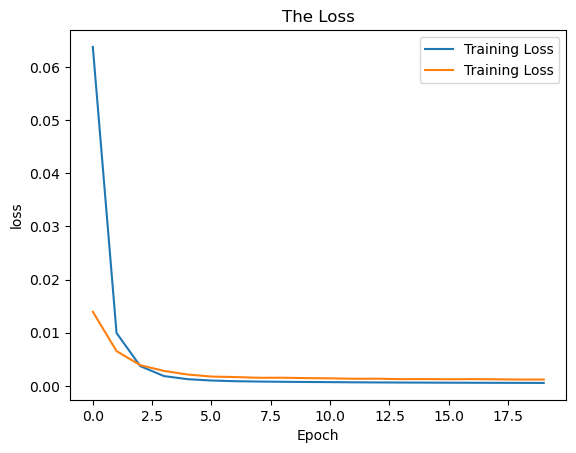

In [ ]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Training Loss")
plt.legend()
plt.title("The Loss")
plt.xlabel("Epoch")
plt.ylabel("loss")
plt.show()

In [ ]:
class Visualization:
    labels = ["Normal", "Anomaly"]

    def draw_anomaly(self, y, error, threshold):
        groupsDF = pd.DataFrame({'error': error,
                                 'true': y}).groupby('true')

        figure, axes = plt.subplots(figsize=(12, 8))

        for name, group in groupsDF:
            axes.plot(group.index, group.error, marker='x' if name == 1 else 'o', linestyle='',
                    color='r' if name == 1 else '0', label="Anomaly" if name == 1 else "Normal")

        axes.hlines(threshold, axes.get_xlim()[0], axes.get_xlim()[1], colors="b", zorder=100, label='Threshold')
        axes.legend()

        plt.title("Anomalies")
        plt.ylabel("Error")
        plt.xlabel("Data")
        plt.show()

1075/1075 [==============================] - 1s 892us/step


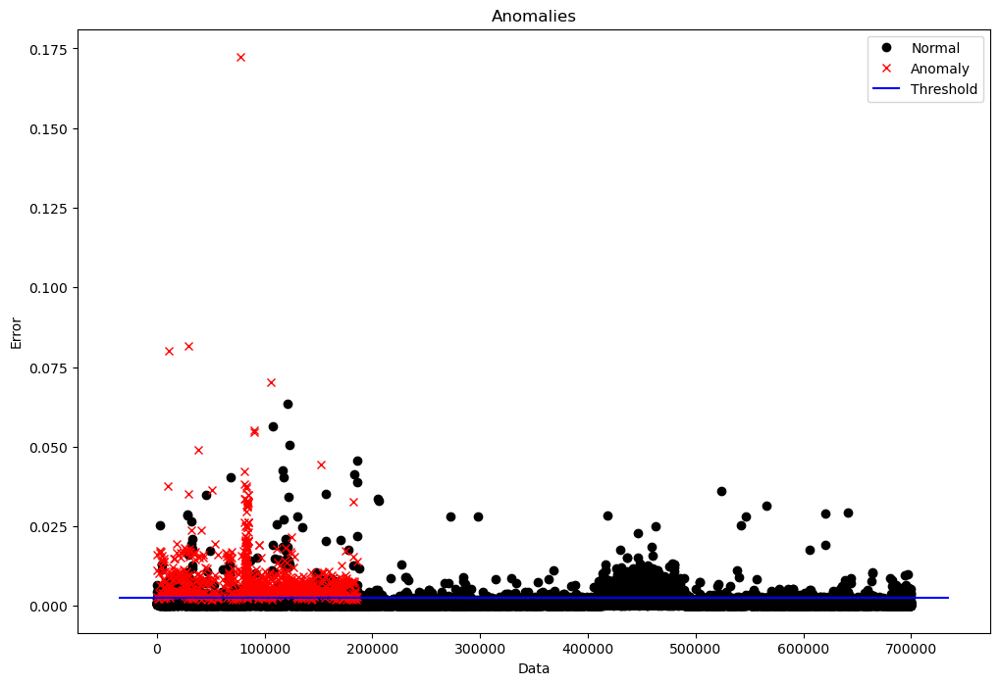

In [ ]:
test_reconstructions = autoencoder.predict(X_test_scaled)
test_error = tf.keras.losses.mse(test_reconstructions, X_test_scaled)

viz = Visualization()
viz.draw_anomaly(y_test, test_error, threshold)

# Interpretability

In [ ]:
EX_sample, _ = train_test_split(X_test_scaled, test_size=0.99, 
                                                    stratify = y_test, random_state= 50, shuffle = True)

In [ ]:
# lime
import lime
from lime import lime_tabular
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_scaled),
    feature_names=list(X_train_scaled.columns),
    class_names= [0, 1])

In [ ]:
for i in range(40, 43):
    exp = lime_explainer.explain_instance(
        data_row = EX_sample.iloc[i], 
        predict_fn = autoencoder.predict
    )
    exp.show_in_notebook(show_table=True)

157/157 [==============================] - 0s 700us/step


/Users/cengrui/anaconda3/lib/python3.10/site-packages/lime/lime_tabular.py:372: UserWarning: 
                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    
  warnings.warn("""


157/157 [==============================] - 0s 1ms/step


/Users/cengrui/anaconda3/lib/python3.10/site-packages/lime/lime_tabular.py:372: UserWarning: 
                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    
  warnings.warn("""


157/157 [==============================] - 0s 1ms/step


/Users/cengrui/anaconda3/lib/python3.10/site-packages/lime/lime_tabular.py:372: UserWarning: 
                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    
  warnings.warn("""


In [ ]:
# shap
import shap
shap.initjs()

In [ ]:
explainer_auto = shap.KernelExplainer(autoencoder, shap.sample(X_train_scaled, 1000))
shap_values_auto = explainer_auto.shap_values(EX_sample, nsamples=500)

Using 1000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/343 [00:00<?, ?it/s]

In [ ]:
shap.force_plot(explainer_auto.expected_value[1], shap_values_auto[1], 
                EX_sample,feature_names = X_test_scaled.columns)

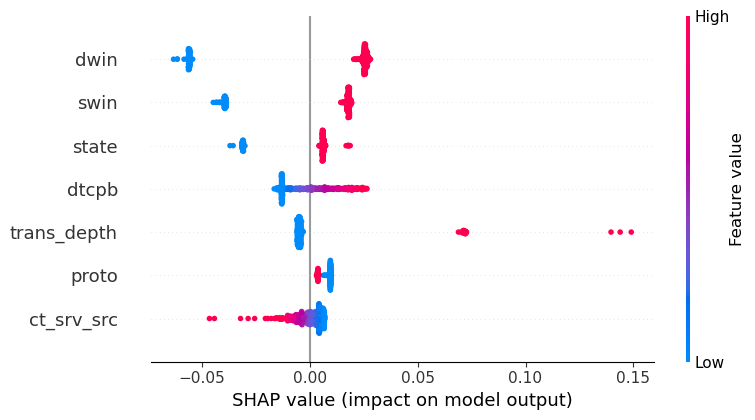

In [ ]:
shap.summary_plot(shap_values_auto[1], EX_sample, feature_names = EX_sample.columns, max_display = 7)

# Logistic Regression

In [ ]:
num_col = list(data.select_dtypes(include='number').columns)
# num_col.remove('id')
num_col.remove('Label')

minmax_scale = MinMaxScaler(feature_range=(0, 1))
def normalization(df,col):
    for i in col:
        arr = df[i]
        arr = np.array(arr)
        df[i] = minmax_scale.fit_transform(arr.reshape(len(arr),1))
    return df

data = normalization(data.copy(),num_col)

In [ ]:
X = data.drop('Label', axis = 1)
y = data["Label"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    stratify = y, random_state= 50,shuffle = True)
log_reg = LogisticRegression(random_state=123, max_iter=5000)

In [ ]:
log_reg.fit(X_train,y_train)
y_pred = log_reg.predict(X_test)

print("Mean Absolute Error - " , metrics.mean_absolute_error(y_test, y_pred))
print("Mean Squared Error - " , metrics.mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2 Score - " , metrics.explained_variance_score(y_test, y_pred)*100)
print("Accuracy - ",metrics.accuracy_score(y_test,y_pred)*100)

cls_report= classification_report(y_true=y_test, y_pred=y_pred,target_names= ["0","1"])
print(cls_report)

Mean Absolute Error -  0.006072948107203898
Mean Squared Error -  0.006072948107203898
Root Mean Squared Error -  0.07792912233051197
R2 Score -  80.60979130708999
Accuracy -  99.39270518927961
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     26610
           1       0.88      0.95      0.91       889

    accuracy                           0.99     27499
   macro avg       0.94      0.97      0.95     27499
weighted avg       0.99      0.99      0.99     27499



In [ ]:
test = X_test.reset_index(drop=True, inplace = False)
y_t = y_test.reset_index(drop=True, inplace = False)

In [ ]:
# lime
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=list(X_train.columns),
    class_names=np.array([0, 1]))

In [ ]:
for i in list([0,1,2,3,4,5]):
    exp = lime_explainer.explain_instance(
        data_row=test.iloc[i], 
        predict_fn=log_reg.predict_proba
    )


    exp.show_in_notebook(show_table=True)

X does not have valid feature names, but LogisticRegression was fitted with feature names


X does not have valid feature names, but LogisticRegression was fitted with feature names


X does not have valid feature names, but LogisticRegression was fitted with feature names


X does not have valid feature names, but LogisticRegression was fitted with feature names


X does not have valid feature names, but LogisticRegression was fitted with feature names


X does not have valid feature names, but LogisticRegression was fitted with feature names


In [ ]:
# shap
shap_explainer = shap.LinearExplainer(log_reg, X_train, feature_dependence="independent")
shap_values = shap_explainer.shap_values(test)

The option feature_dependence has been renamed to feature_perturbation!
The option feature_perturbation="independent" is has been renamed to feature_perturbation="interventional"!
The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, or maskers.Impute)


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


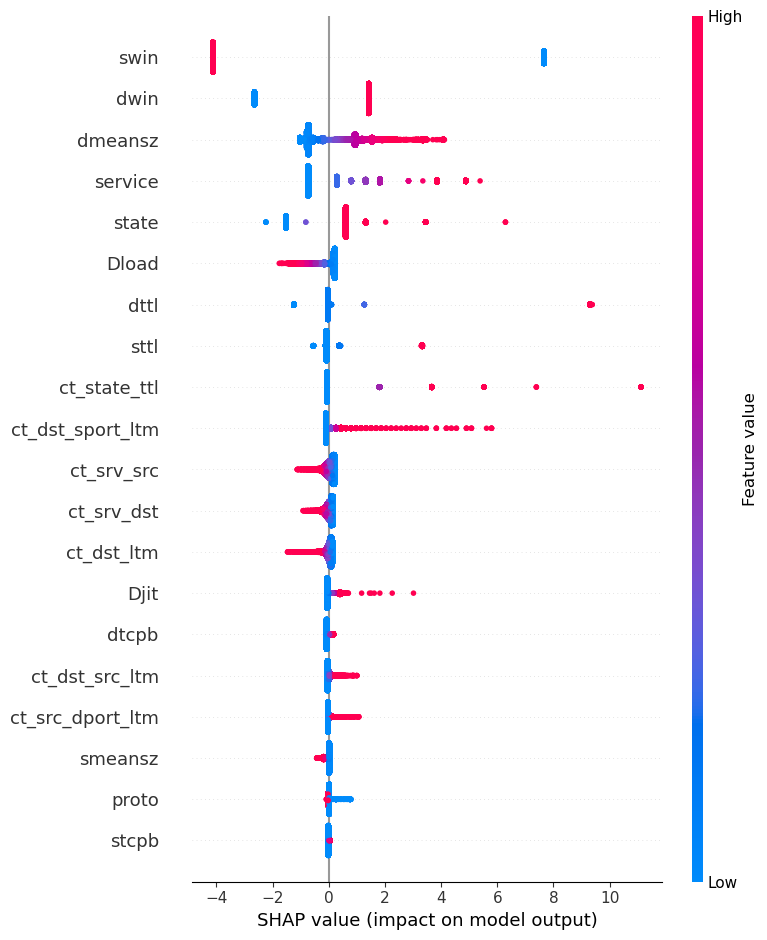

In [ ]:
shap.summary_plot(shap_values, test, feature_names = test.columns)